In [1]:
suppressMessages(library(tidyverse))
suppressMessages(library(parallel))
suppressMessages(library(Seurat))
suppressMessages(library(SeuratData))
suppressMessages(library(patchwork))
suppressMessages(library(Matrix))
suppressMessages(library(viridis))
suppressMessages(library(cowplot))
suppressMessages(library(ggsci))
suppressMessages(library(pheatmap))
suppressMessages(library(RColorBrewer))
suppressMessages(library(reshape2))
suppressMessages(library(LSD))
suppressMessages(library(readxl))
suppressMessages(library(ggrepel))
suppressMessages(library(randomForest))
suppressMessages(library(harmony))
library(Seurat)
library(dplyr)
library(tidyverse)
library(ggplot2)
library(Seurat)
library(sf)
library(RColorBrewer)
library(ggdendro)
suppressMessages(library(SeuratData))
suppressMessages(library(patchwork))
suppressMessages(library(Matrix))
suppressMessages(library(viridis))
suppressMessages(library(cowplot))
suppressMessages(library(ggsci))
suppressMessages(library(pheatmap))
suppressMessages(library(RColorBrewer))
suppressMessages(library(reshape2))
suppressMessages(library(LSD))
suppressMessages(library(readxl))
suppressMessages(library(ggrepel))
suppressMessages(library(harmony))
library(pvclust)

Linking to GEOS 3.11.0, GDAL 3.5.2, PROJ 9.0.1; sf_use_s2() is TRUE



 num [1:49, 1:50] 2382 215 33 0 0 ...
 - attr(*, "dimnames")=List of 2
  ..$ : chr [1:49] "Astrocytes_0" "Astrocytes_1" "Endotheial_0" "Excit_Neuron_0" ...
  ..$ : chr [1:50] "Astrocytes_0" "Astrocytes_1" "Endotheial_0" "Excit_Neuron_0" ...


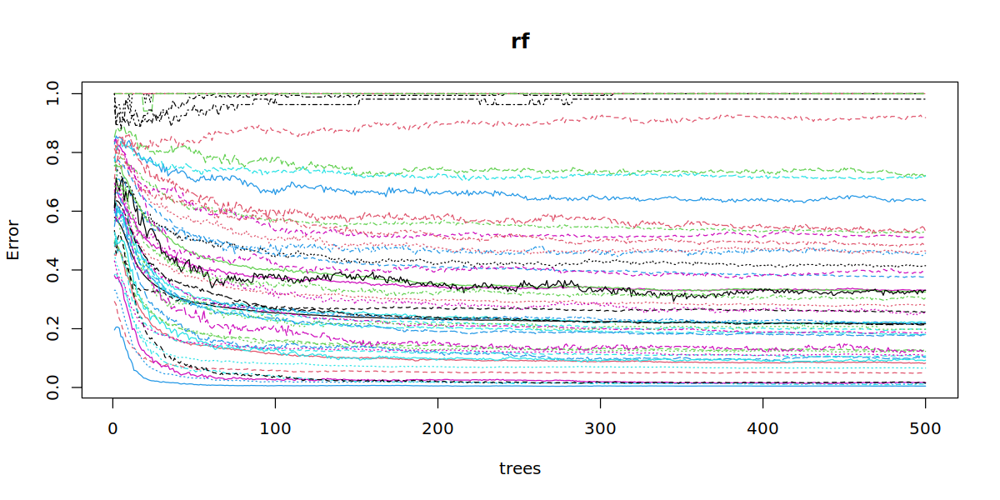

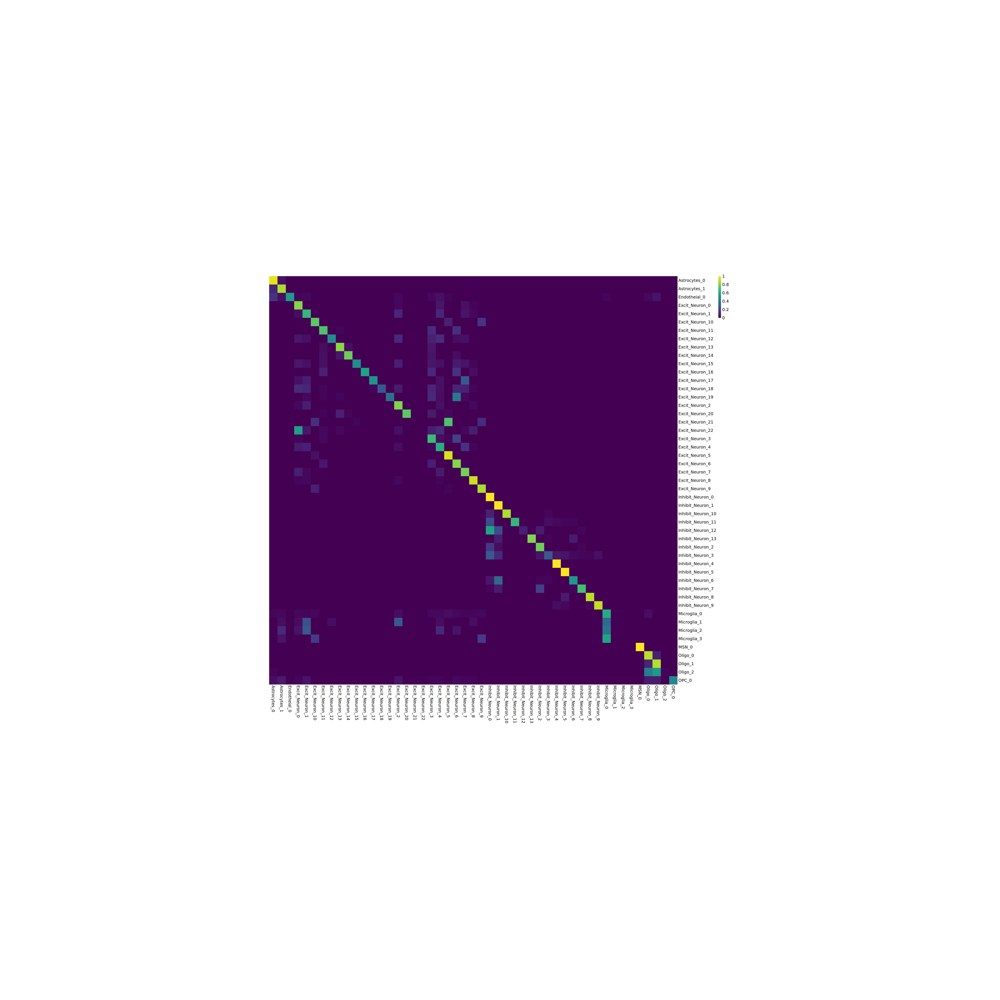

[1] 49

[1] 39

[1] 20

[1] 11

[1] 8

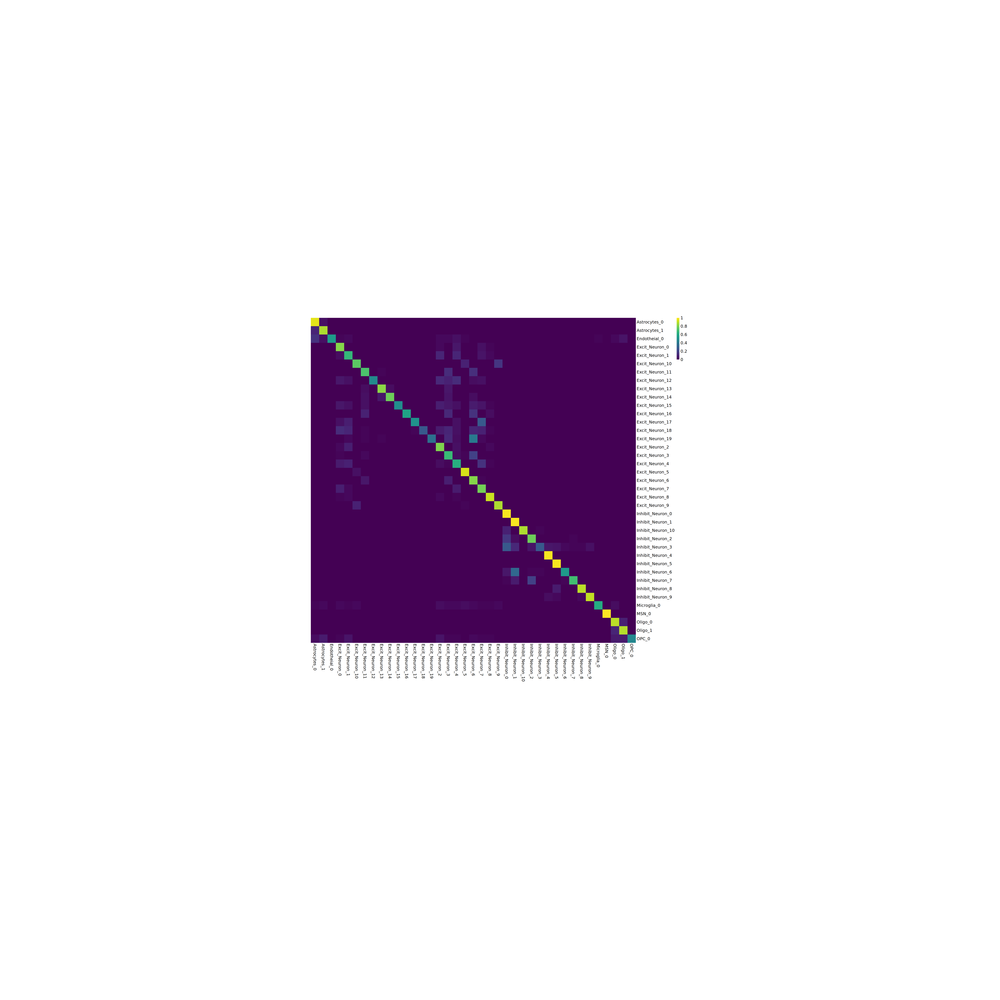

In [3]:

EX_resolution=1.0
IN_resolution=0.5
NON_resolution=0.05


anno_dir='/home/liuyx/liuyuxuan/spa_seurat/cla/marmoset/batch_normalize_renew_240115/dif_res_anno/'
anno_file=paste0(anno_dir,EX_resolution,'_res',IN_resolution,'_res',NON_resolution,'_anno.csv')
anno=read.csv(anno_file)
#table(anno$Subclass)


dataDir=anno_dir
saveDir=paste0(dataDir,'train_seurat/')

rf = readRDS(paste0(saveDir, "/Subclass.randomForest.20230627res",EX_resolution,'_res',IN_resolution,".rds"))
str(rf$confusion)
options(repr.plot.width=10, repr.plot.height=5)
plot(rf)

confusionRatio = t(apply(rf$confusion[1:min(dim(rf$confusion)), 1:min(dim(rf$confusion))], 1, function(x) {x/sum(x)}))
options(repr.plot.width=50, repr.plot.height=50)
pheatmap(confusionRatio, breaks=seq(0,1,0.01), cluster_rows=F, cluster_cols=F, border_color=NA, cellwidth=30, cellheight=30, fontsize=15,color = viridis(100))

df_num=as.data.frame(table(anno$Subclass))
select_cell=df_num[df_num$Freq>300,]$Var1

df_num_ex=df_num[grep('Excit',df_num$Var1),]
fil_n=df_num_ex[df_num_ex$Freq<=500,]$Var1

fil_n=as.character(fil_n)
select_cell=as.character(select_cell)
select_cell=setdiff(select_cell,fil_n)
select_cell=c(select_cell,'Endotheial_0')
pheatmap(confusionRatio[intersect(rownames(confusionRatio),select_cell),intersect(colnames(confusionRatio),select_cell)]
, breaks=seq(0,1,0.01), cluster_rows=F, cluster_cols=F, border_color=NA, cellwidth=30, cellheight=30, fontsize=15,color = viridis(100))

nrow(df_num)
length(select_cell)
ex=select_cell[grep('Ex',select_cell)]
in_=select_cell[grep('In',select_cell)]
non=setdiff(select_cell,c(ex,in_))
length(ex)
length(in_)
length(non)

In [7]:
select_cell

[1] "Astrocytes_0"      "Astrocytes_1"      "Excit_Neuron_0"   
 [4] "Excit_Neuron_1"    "Excit_Neuron_10"   "Excit_Neuron_11"  
 [7] "Excit_Neuron_12"   "Excit_Neuron_13"   "Excit_Neuron_14"  
[10] "Excit_Neuron_15"   "Excit_Neuron_16"   "Excit_Neuron_17"  
[13] "Excit_Neuron_18"   "Excit_Neuron_19"   "Excit_Neuron_2"   
[16] "Excit_Neuron_3"    "Excit_Neuron_4"    "Excit_Neuron_5"   
[19] "Excit_Neuron_6"    "Excit_Neuron_7"    "Excit_Neuron_8"   
[22] "Excit_Neuron_9"    "Inhibit_Neuron_0"  "Inhibit_Neuron_1" 
[25] "Inhibit_Neuron_10" "Inhibit_Neuron_2"  "Inhibit_Neuron_3" 
[28] "Inhibit_Neuron_4"  "Inhibit_Neuron_5"  "Inhibit_Neuron_6" 
[31] "Inhibit_Neuron_7"  "Inhibit_Neuron_8"  "Inhibit_Neuron_9" 
[34] "Microglia_0"       "MSN_0"             "Oligo_0"          
[37] "Oligo_1"           "OPC_0"             "Endotheial_0"

An object of class Seurat 
63792 features across 109386 samples within 2 assays 
Active assay: SCT (30873 features, 5000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

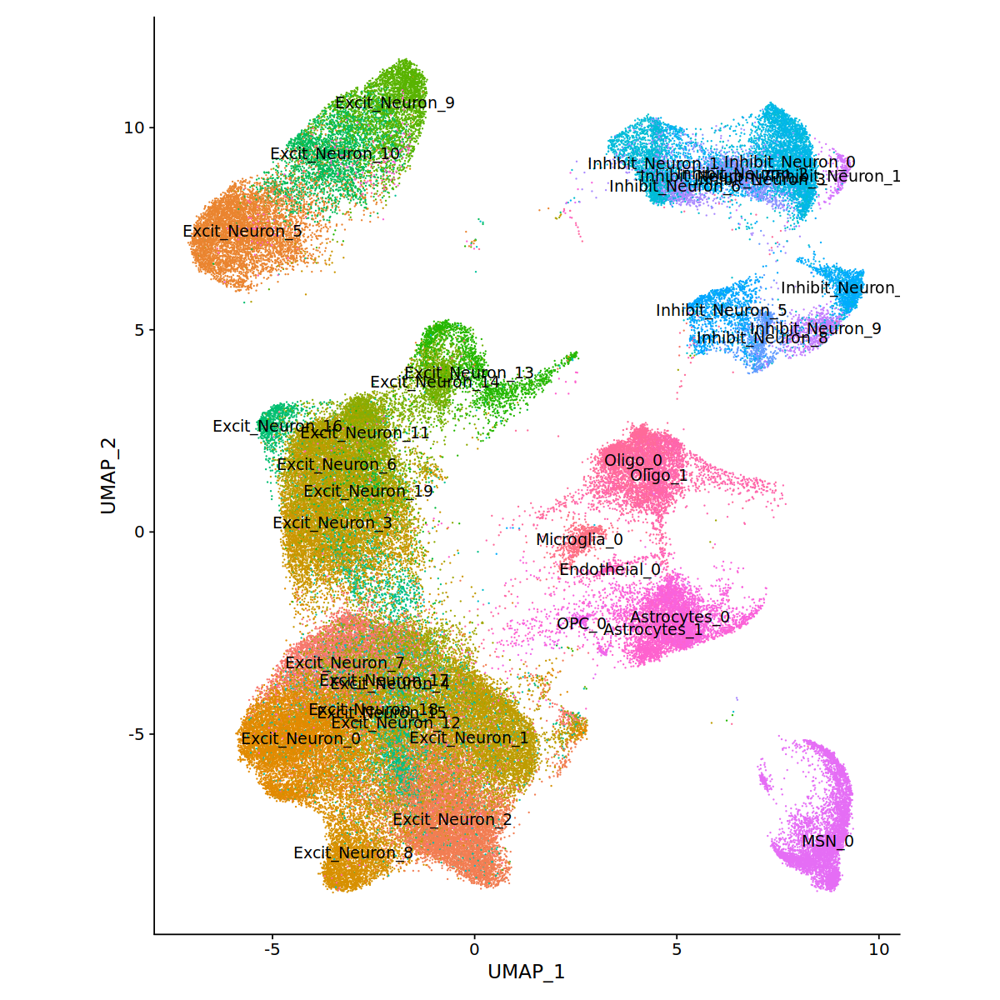

In [4]:
classFiltSeurat=readRDS('/home/liuyx/liuyuxuan/spa_seurat/cla/marmoset/batch_normalize_renew_240115/marmoset_snrna_all_soupX_fil300_800_anno_SCT_RFfil_240116.rds')
classFiltSeurat

rownames(anno)=anno$X
anno$X=NULL
classFiltSeurat=AddMetaData(classFiltSeurat,anno)

classFiltSeurat1=subset(classFiltSeurat, Subclass %in% select_cell)
Idents(classFiltSeurat1) = "Subclass"
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(classFiltSeurat1, reduction="umap", label=T,raster=FALSE)+coord_fixed()+NoLegend()
classFiltSeurat1


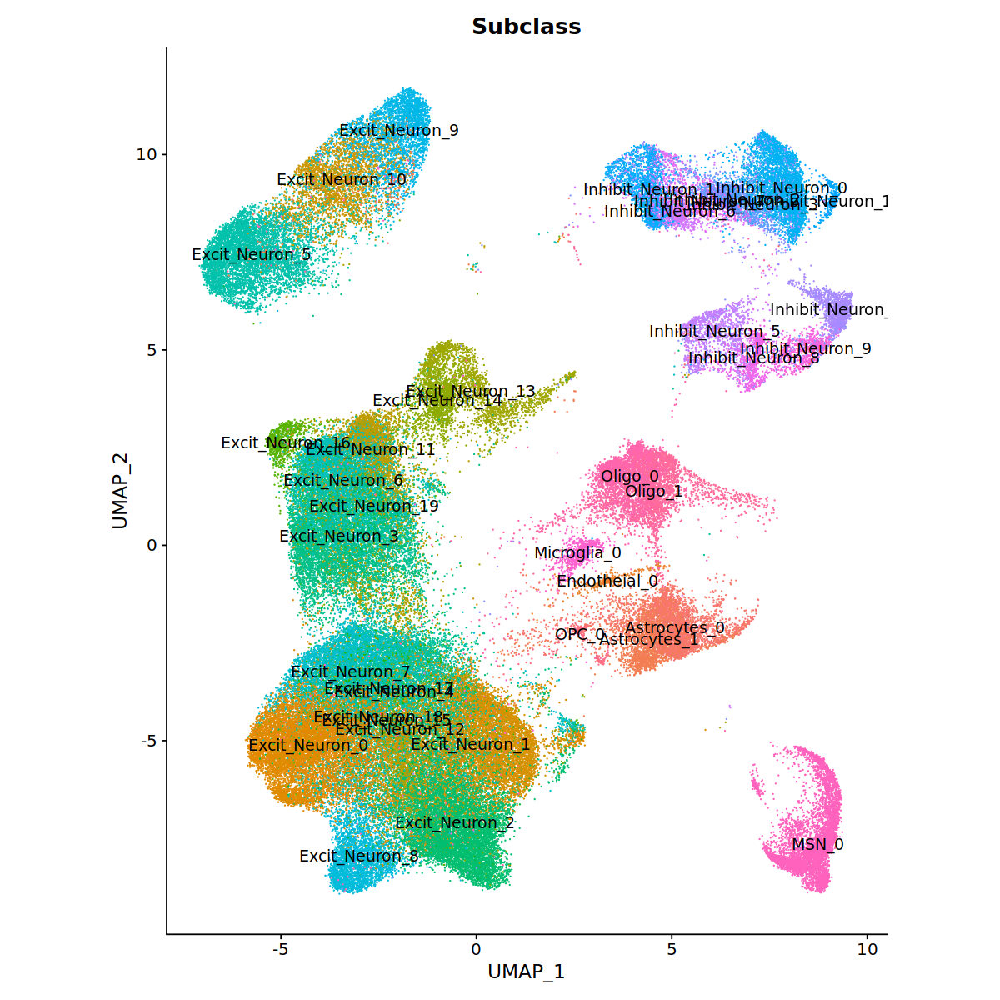

In [5]:
DimPlot(classFiltSeurat1,group.by = 'Subclass',label=T,raster=FALSE)+coord_fixed()+NoLegend()


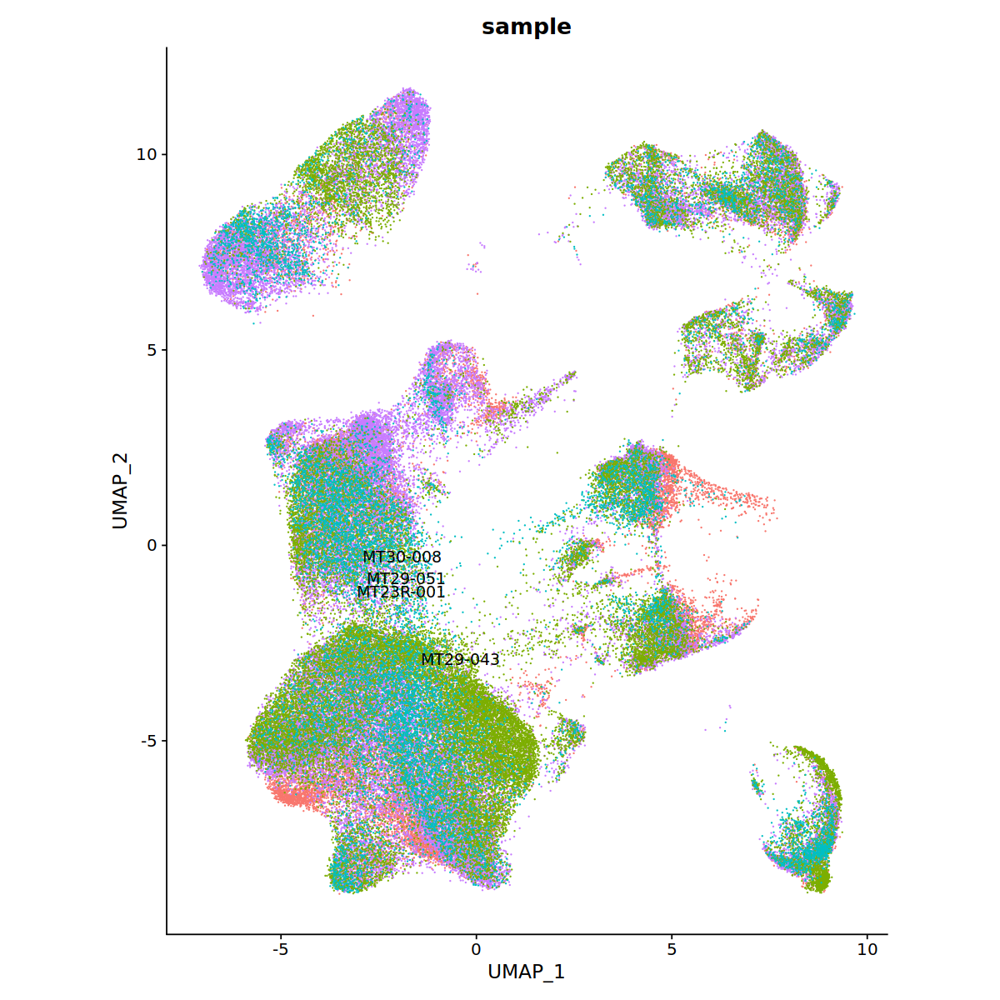

In [6]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(classFiltSeurat1,group.by = 'sample',label=T,raster=FALSE)+coord_fixed()+NoLegend()


Centering and scaling data matrix

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 5469300)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony converged after 5 iterations

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.SCT.harmony; see ?make.names for more details on syntax validity”
Computing nearest neighbor graph

Computing SNN

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
11:14:22 UMAP embedding parameters a = 0.9922 b = 1.112

11:14:22 Read 109386 rows and found 30 numeric columns

11:14:22 Using Annoy for neighbor search, n_neighbors = 30

11:14:22 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40 

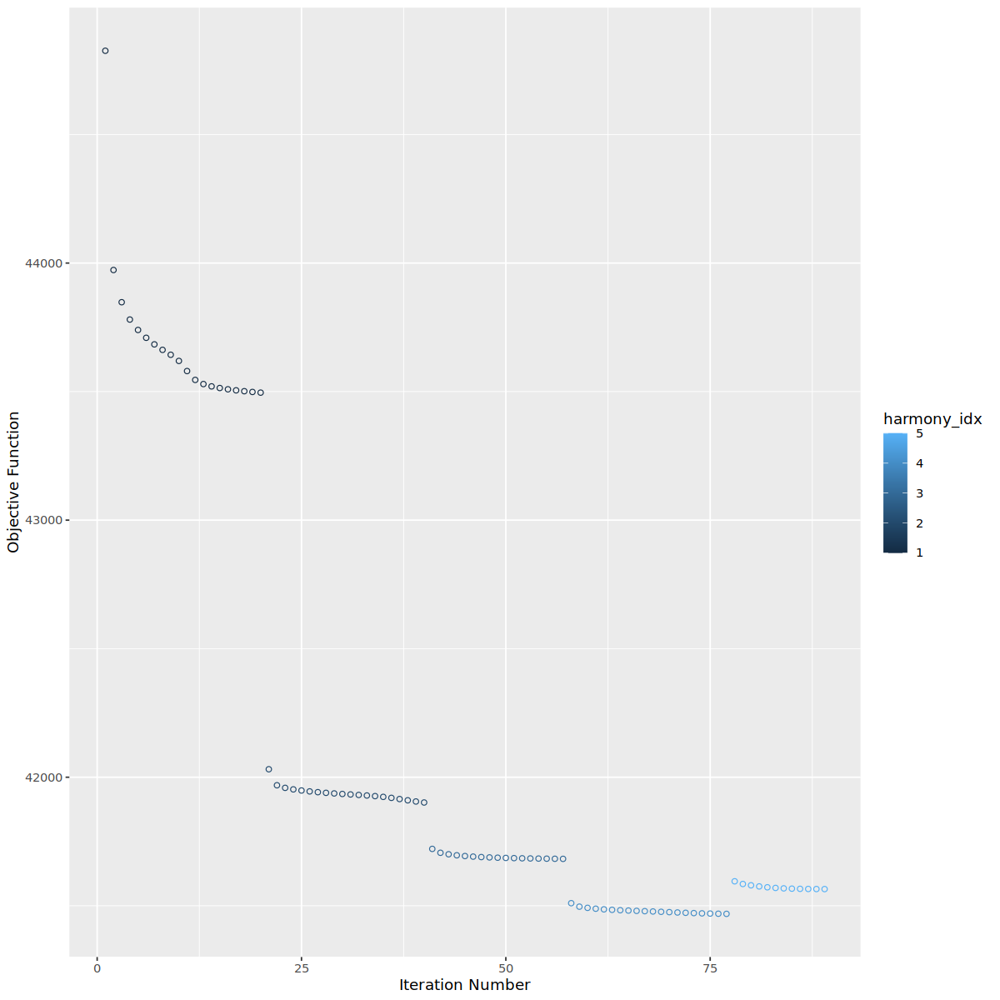

In [8]:
classFiltSeurat=classFiltSeurat1
classFiltSeurat =  NormalizeData(classFiltSeurat, normalization.method = "LogNormalize", scale.factor = 10000)
classFiltSeurat = FindVariableFeatures(classFiltSeurat, selection.method = "vst", nfeatures = nrow(classFiltSeurat))
classFiltSeurat = ScaleData(classFiltSeurat, features = rownames(classFiltSeurat))


classFiltSeurat = RunHarmony(
    classFiltSeurat, group.by.vars="sample", plot_convergence=T, 
    reduction = "pca", dims.use=1:30,
    theta=2,)
classFiltSeurat = classFiltSeurat %>% 
    FindNeighbors(reduction="harmony", dims = 1:30) %>%
    FindClusters(verbose = FALSE) %>%
    RunUMAP(reduction="harmony", dims = 1:30)


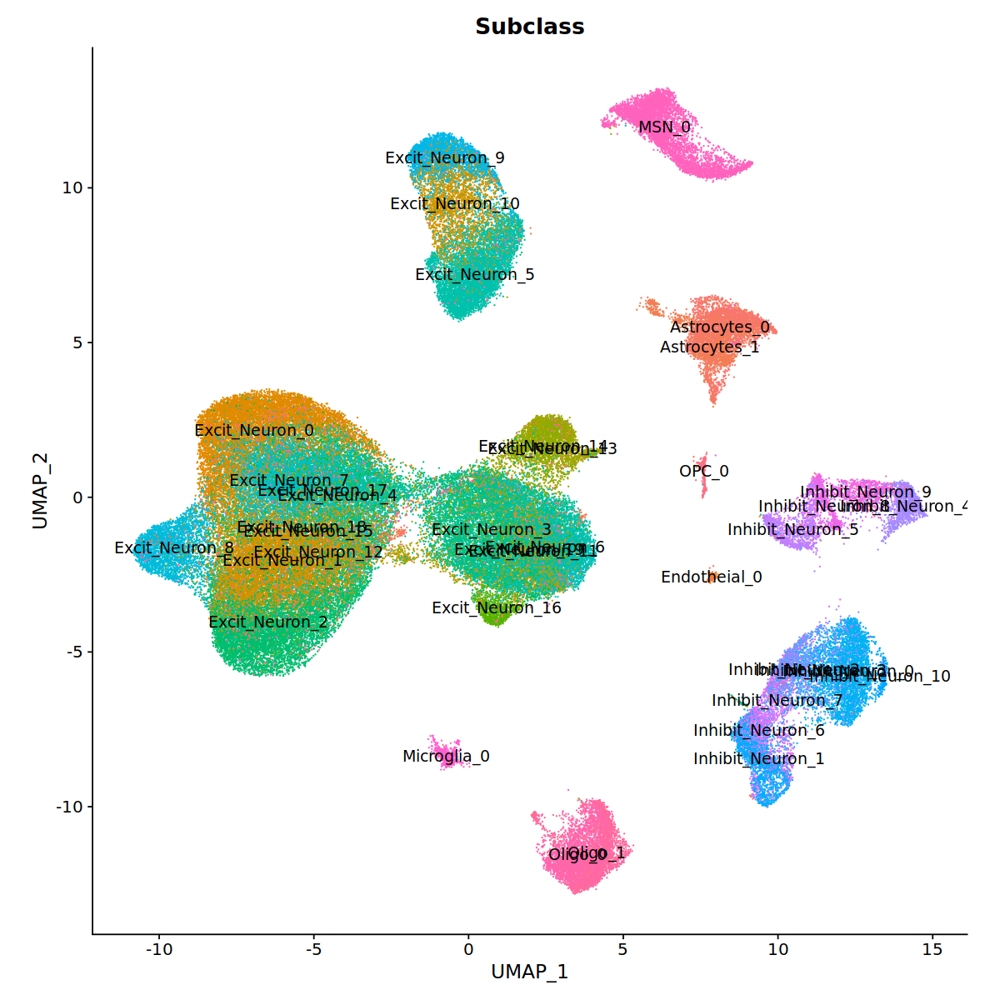

In [12]:
DimPlot(classFiltSeurat,group.by = 'Subclass',label=T,raster=FALSE)+coord_fixed()+NoLegend()


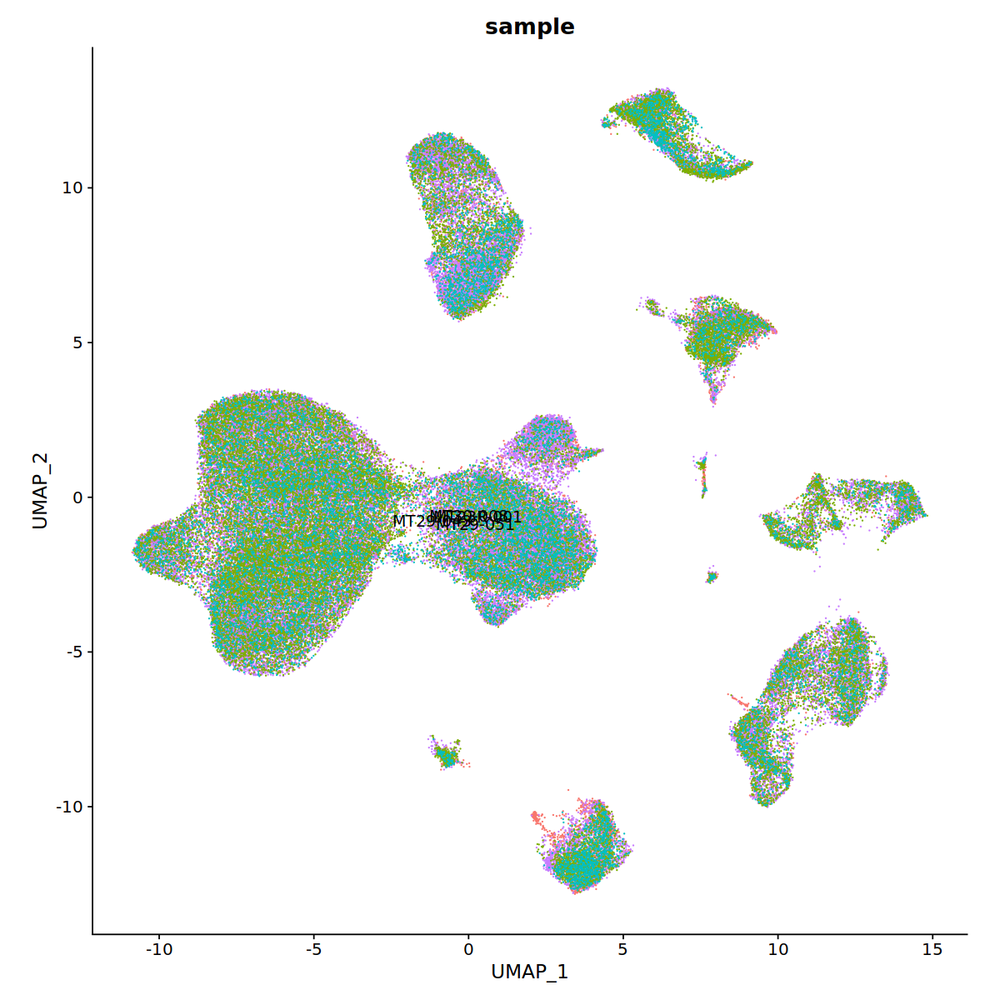

In [13]:
DimPlot(classFiltSeurat,group.by = 'sample',label=T,raster=FALSE)+coord_fixed()+NoLegend()


In [14]:
#重命名cluster
get_anno=function(cortex,marker_num){
    cortex$Cluster=cortex$Subclass
    marker=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_1031/dif_res_anno1/train_seurat/train_res1.1_res0.9_res0.15_downsample3000_supercluster_marker.csv')

    sort_marker=marker %>% group_by(cluster) %>% top_n(n=marker_num,wt=avg_log2FC)
    sort_marker1=sort_marker[,c('cluster','gene')]
    sort_marker1=as.data.frame(sort_marker1)
    sort_marker1=sort_marker1[order(sort_marker1$cluster),]
    dotplot_genes=sort_marker$gene
    dotplot_genes=intersect(dotplot_genes,rownames(cortex[["SCT"]]@data))
    sort_marker1=sort_marker1[sort_marker1$gene %in% dotplot_genes,]
    sort_marker1=sort_marker1[!duplicated(sort_marker1$gene),]
    dotplot_genes=sort_marker1$gene

    sel_gene=dotplot_genes
    cla=cortex
    df_ref=cortex@meta.data[,'Cluster',drop=F]
    df_ref$cellID=rownames(df_ref)


    df=cla@assays$SCT@counts[sel_gene,]
    df=as.data.frame(t(df))
    df$cellID=rownames(df)

    df=left_join(df,df_ref)
    df$cellID=NULL

    df_re=split(df,df$Cluster)

    i=1
    df_re[[i]]$Cluster=NULL
    df_sub=as.data.frame(apply(df_re[[i]],2,mean))
    colnames(df_sub)=names(df_re)[i]
    df_sum=df_sub
    for(i in c(2:length(names(df_re)))){df_re[[i]]$Cluster=NULL
    df_sub=as.data.frame(apply(df_re[[i]],2,mean))
    colnames(df_sub)=names(df_re)[i]
    df_sum=cbind(df_sum,df_sub)}

    sel=rownames(df_sum)[apply(df_sum,1,sum)==0]
    other=setdiff(rownames(df_sum),sel)
    df_sum=df_sum[other,]

    #df_sum=df_sum[df_sum$EX_VENO>2,]
    df_sum_renew=apply(df_sum,1,function(f){
        f/max(f)
    })
    reorder_matrix <- function(matrix1, by.rows = TRUE) {
      if (by.rows == TRUE) {
        conf.order <- order(apply(matrix1, 1, which.max))
        matrix1.reordered <- matrix1[conf.order, ]
      } else {
        conf.order <- order(apply(matrix1, 2, which.max))
        matrix1.reordered <- matrix1[, conf.order]
      }
    }

    df_sum_renew1 = reorder_matrix(df_sum_renew, by.rows=F)

    #options(repr.plot.width=80, repr.plot.height=30)
    #pheatmap(df_sum_renew1
    #, breaks=seq(0,1,0.01), cluster_rows=F, cluster_cols=F, border_color=NA, cellwidth=30, cellheight=30, fontsize=15,
    #        color = viridis(100),display_numbers = T )

    rownames(sort_marker1)=sort_marker1$gene
    sort_marker1$rename=paste0(sort_marker1$cluster,'_',sort_marker1$gene)
    df_sum_renew2=df_sum_renew1
    colnames(df_sum_renew2)=sort_marker1[colnames(df_sum_renew1),]$rename
    #sel1=sort_marker1[grep('L[0-9].*',sort_marker1$cluster),]$rename

    sel1=sort_marker1$rename
    as=sel1[grep('Astro',sel1)]
    as1=sel1[grep('Oligo',sel1)]
    sel1=setdiff(sel1,c(as,as1))
    sel2=rownames(df_sum_renew2)[grep('Excit',rownames(df_sum_renew2))]
    df_sum_renew3=df_sum_renew2[,intersect(colnames(df_sum_renew2),sel1)]
    df_sum_renew3=t(df_sum_renew3)



    df_sum_renew3=df_sum_renew3[order(rownames(df_sum_renew3)),]

    df_sum_renew4 = reorder_matrix(df_sum_renew3,by.rows = F)
    options(repr.plot.width=30, repr.plot.height=40)

    name=str_extract(rownames(df_sum_renew4),'.*_')
    name=gsub('_','',name)
    df_sum_renew4=as.data.frame(df_sum_renew4)
    df_sum_renew4$reorder=name
    df_sum_renew4_list=split(df_sum_renew4,df_sum_renew4$reorder)

    aba_all=data.frame()
    df=df_sum_renew4_list[[1]]
    df=as.data.frame(df)
    df$reorder=NULL
    aba=apply(df,2,mean)
    aba_all=rbind(aba_all,aba)
    colnames(aba_all)=names(aba)

    for(i in c(2:length(df_sum_renew4_list))){
        df=df_sum_renew4_list[[i]]
        df=as.data.frame(df)
        df$reorder=NULL
        aba=apply(df,2,mean)
        aba_all=rbind(aba_all,aba)

    }

    rownames(aba_all)=names(df_sum_renew4_list)

    df_sum=data.frame()
    for(i in c(1:ncol(aba_all))){
        cell=colnames(aba_all)[i]
        type=rownames(aba_all)[aba_all[,i]==max(aba_all[,i])]
        df_sum=rbind(df_sum,c(cell,type))
        }
    return(df_sum)
}



Joining, by = "cellID"
Joining, by = "Subclass"


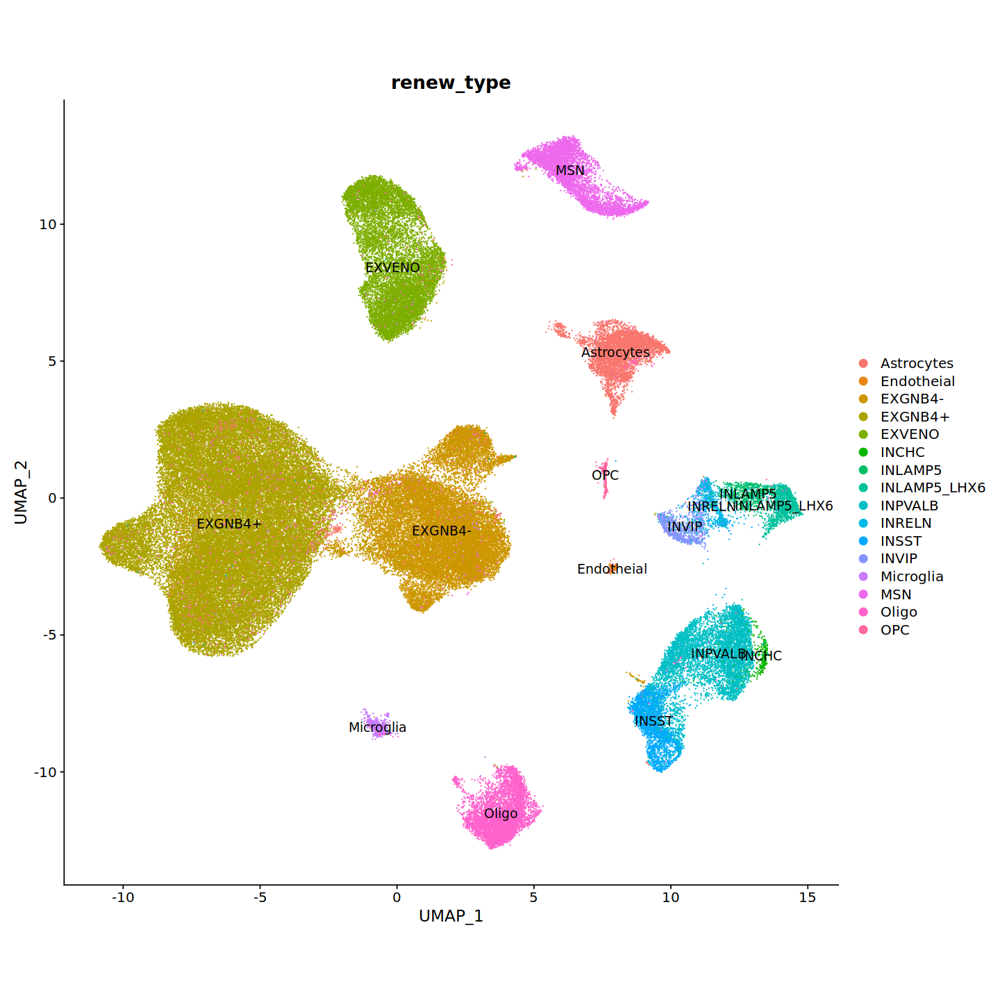

In [15]:
df_sum=get_anno(classFiltSeurat,20)

colnames(df_sum)=c('Subclass','renew_type')
df_sum[grep('Astrocytes',df_sum$Subclass),]$renew_type='Astrocytes'
#df_sum[grep('OPC',df_sum$Subclass),]$renew_type='OPC'
df_sum[grep('Oligo',df_sum$Subclass),]$renew_type='Oligo'


df_sum[df_sum$Subclass %in% c('Inhibit_Neuron_4'),]$renew_type='INLAMP5_LHX6'


cortex=classFiltSeurat
ref=cortex@meta.data[,'Subclass',drop=F]
ref$ID=rownames(ref)
colnames(df_sum)=c('Subclass','renew_type')
ref=left_join(ref,df_sum)
cortex=AddMetaData(cortex,ref$renew_type,col.name = 'renew_type')


options(repr.plot.width=12, repr.plot.height=12)
DimPlot(cortex,group.by = 'renew_type',label=T,raster=FALSE)+coord_fixed()


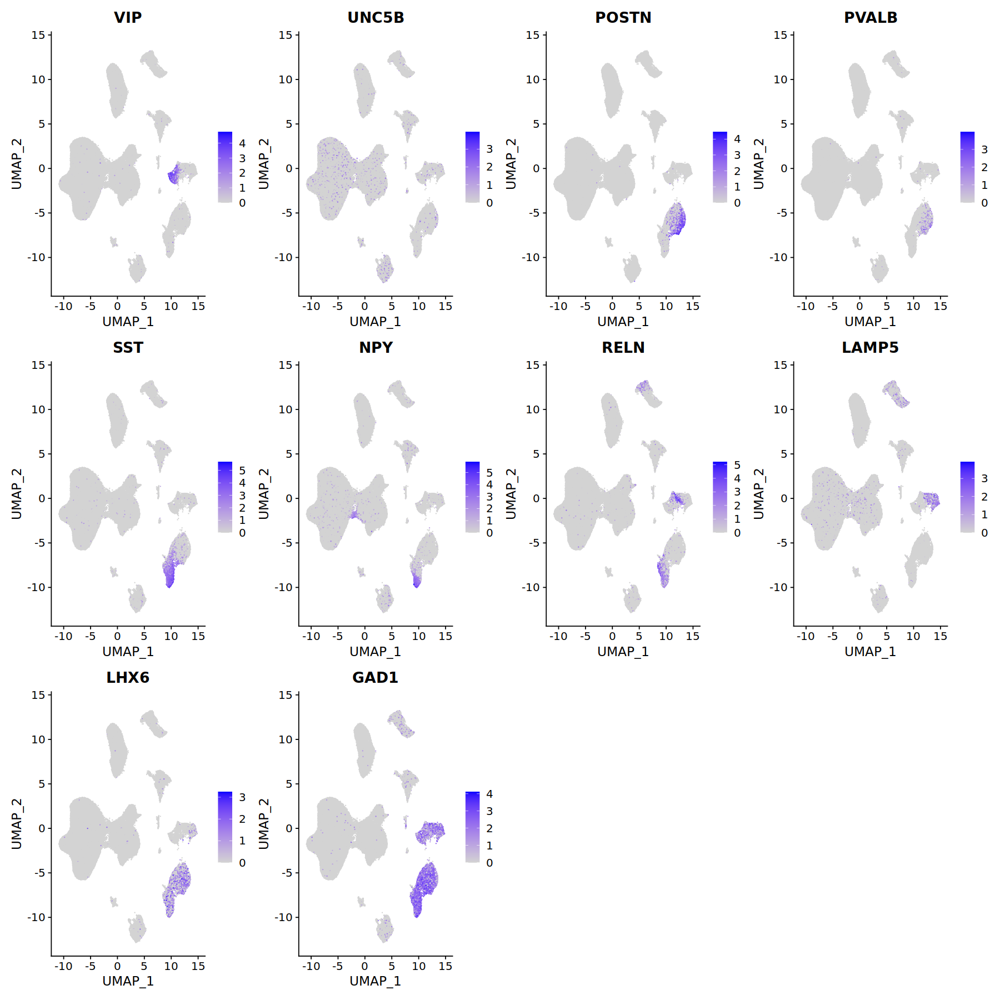

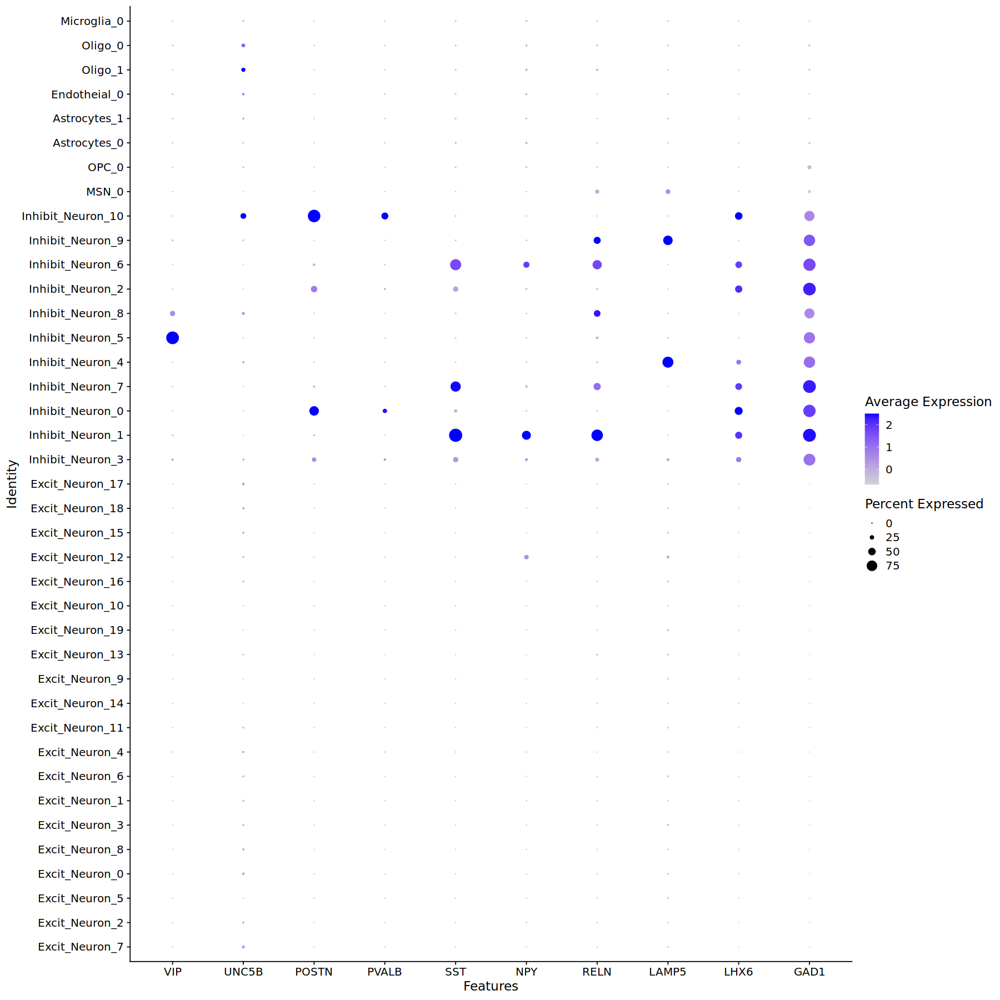

In [16]:

classMarkerTop = c('VIP','UNC5B','POSTN','PVALB','SST','NPY','RELN','LAMP5','LHX6','GAD1')

options(repr.plot.width=15, repr.plot.height=15)
FeaturePlot(classFiltSeurat, features = classMarkerTop,raster=FALSE)
Idents(classFiltSeurat)='Subclass'
DotPlot(classFiltSeurat, features = classMarkerTop)

In [17]:
classFiltSeurat2=cortex
unique(classFiltSeurat2$renew_type)
classFiltSeurat2$SuperCluster=classFiltSeurat2$renew_type
classFiltSeurat2$SuperCluster=gsub('EX','GLUT_',classFiltSeurat2$SuperCluster)
classFiltSeurat2$SuperCluster=gsub('IN','GABA_',classFiltSeurat2$SuperCluster)
classFiltSeurat2$SuperCluster=gsub('MSN','GABA_DRD2',classFiltSeurat2$SuperCluster)
unique(classFiltSeurat2$SuperCluster)

df_col=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_0105/post_analysis/data/color_supercluster.csv')
col=df_col$pale
names(col)=df_col$X

pale=col

[1] "EXGNB4+"      "EXVENO"       "EXGNB4-"      "INPVALB"      "INSST"       
 [6] "INLAMP5_LHX6" "INVIP"        "INRELN"       "INLAMP5"      "INCHC"       
[11] "MSN"          "OPC"          "Astrocytes"   "Endotheial"   "Oligo"       
[16] "Microglia"

[1] "GLUT_GNB4+"      "GLUT_VENO"       "GLUT_GNB4-"      "GABA_PVALB"     
 [5] "GABA_SST"        "GABA_LAMP5_LHX6" "GABA_VIP"        "GABA_RELN"      
 [9] "GABA_LAMP5"      "GABA_CHC"        "GABA_DRD2"       "OPC"            
[13] "Astrocytes"      "Endotheial"      "Oligo"           "Microglia"

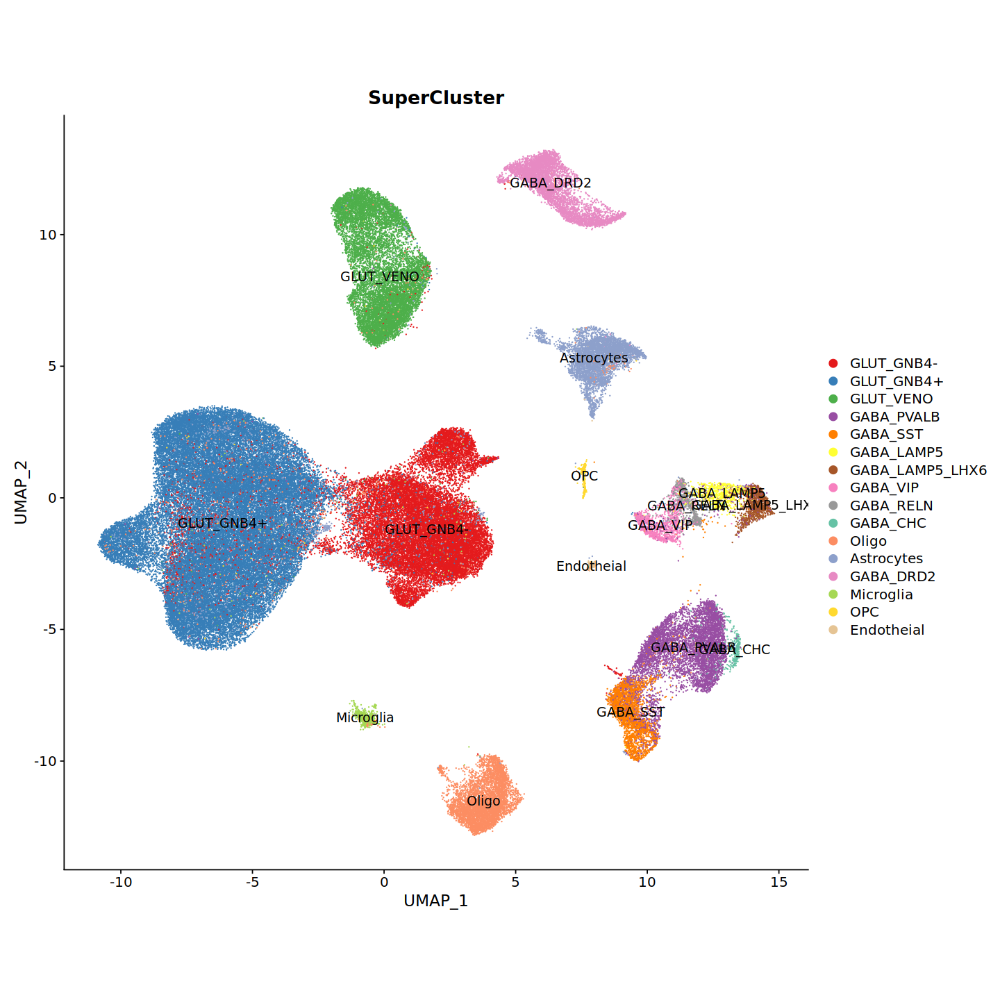

In [18]:
Idents(classFiltSeurat2)='SuperCluster'
options(repr.plot.width=12, repr.plot.height=12)
DimPlot(classFiltSeurat2,group.by = 'SuperCluster',label=T,raster=FALSE,cols = pale)+coord_fixed()


[1] 39

[1] "GLUT_GNB4+_7"      "GLUT_GNB4+_2"      "GLUT_VENO_5"      
 [4] "GLUT_GNB4+_0"      "GLUT_GNB4+_8"      "GLUT_GNB4-_3"     
 [7] "GLUT_GNB4+_1"      "GLUT_GNB4-_6"      "GLUT_GNB4+_4"     
[10] "GLUT_GNB4-_11"     "GLUT_GNB4-_14"     "GLUT_VENO_9"      
[13] "GLUT_GNB4-_13"     "GLUT_GNB4-_19"     "GLUT_VENO_10"     
[16] "GLUT_GNB4-_16"     "GLUT_GNB4-_12"     "GLUT_GNB4+_15"    
[19] "GLUT_GNB4+_18"     "GLUT_GNB4+_17"     "GABA_PVALB_3"     
[22] "GABA_SST_1"        "GABA_PVALB_0"      "GABA_PVALB_7"     
[25] "GABA_LAMP5_LHX6_4" "GABA_VIP_5"        "GABA_RELN_8"      
[28] "GABA_PVALB_2"      "GABA_SST_6"        "GABA_LAMP5_9"     
[31] "GABA_CHC_10"       "GABA_DRD2_0"       "OPC_0"            
[34] "Astrocytes_0"      "Astrocytes_1"      "Endotheial_0"     
[37] "Oligo_1"           "Oligo_0"           "Microglia_0"

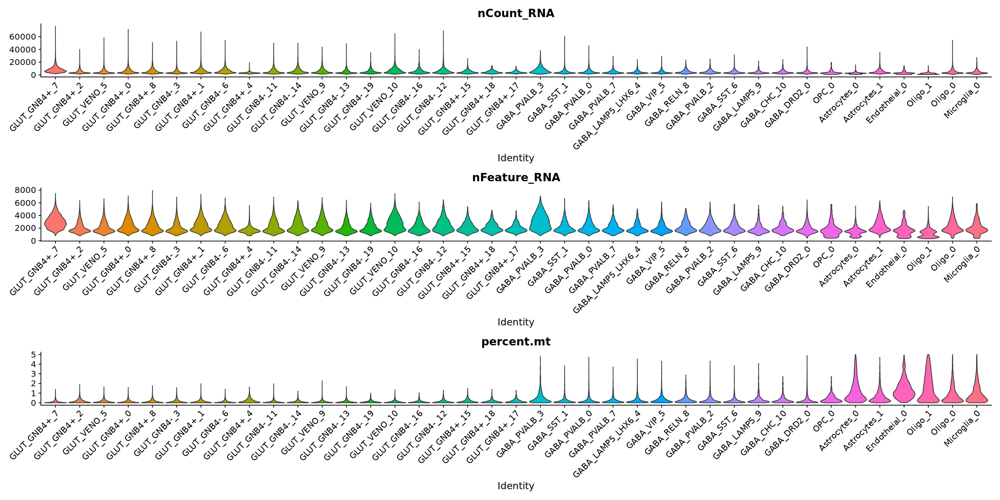

In [19]:
#
classFiltSeurat3=classFiltSeurat2
classFiltSeurat3$id=str_extract(classFiltSeurat3$Subclass,'_[0-9]*$')
classFiltSeurat3$Cluster=paste0(classFiltSeurat3$SuperCluster,classFiltSeurat3$id)
length(unique(classFiltSeurat3$Cluster))
unique(classFiltSeurat3$Cluster)

options(repr.plot.width=20, repr.plot.height=10)
Idents(classFiltSeurat3) = "Cluster"
VlnPlot(classFiltSeurat3, features=c("nCount_RNA", "nFeature_RNA", "percent.mt"), pt.size=0, ncol=1)


Joining, by = "sample"
`summarise()` has grouped output by 'Cluster'. You can override using the
`.groups` argument.
Joining, by = "Cluster"


Cluster,sample,part_num,sum_num,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>
Astrocytes_0,MT23R-001,6529.3276,14021.199,0.46567541
Astrocytes_0,MT29-043,2775.7295,14021.199,0.19796663
Astrocytes_0,MT29-051,2001.0622,14021.199,0.14271691
Astrocytes_0,MT30-008,2715.0798,14021.199,0.19364106
Astrocytes_1,MT23R-001,521.7138,8213.145,0.06352181
Astrocytes_1,MT29-043,3869.0003,8213.145,0.47107418


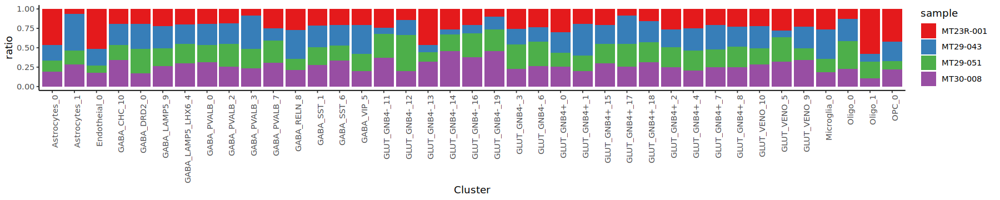

In [20]:

cla=classFiltSeurat3
df_sum=cla@meta.data
#normalize
df_sum$num=1
df_donor=as.data.frame(table(df_sum$sample))
colnames(df_donor)=c('sample','all_num')
df_donor$ratio=df_donor$all_num/sum(df_donor$all_num)
df_donor$weight=1/df_donor$ratio
df_donor=df_donor[,c('sample','weight')]
df_sum=left_join(df_sum,df_donor)
df_sum$num=df_sum$num*df_sum$weight

df1=df_sum %>% group_by(Cluster,sample) %>% summarise(part_num=sum(num))
df2=df_sum %>% group_by(Cluster) %>% summarise(sum_num=sum(num))
df1=left_join(df1,df2)

df1$ratio=df1$part_num/df1$sum_num

head(df1)
#df1$Cluster=factor(df1$Cluster,levels = order)
options(repr.plot.width=15, repr.plot.height=3)

p1=ggplot(data = df1, aes(x = Cluster, y = ratio, fill = sample)) +
 geom_bar(stat = "identity", position = "stack")+theme_classic()+
scale_fill_manual(values = brewer.pal(9,"Set1"))+ theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust=1))

p1


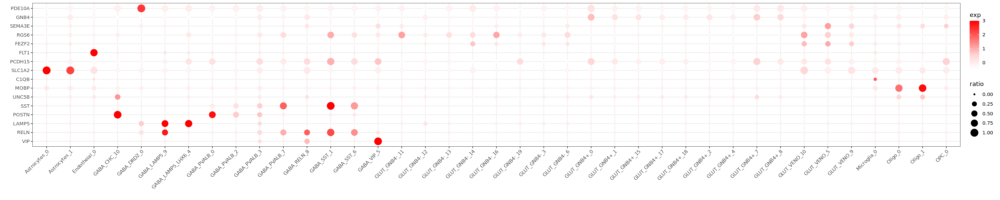

In [21]:
dotplot_genes =c('PDE10A','GNB4','SEMA3E','RGS6','FEZF2',
    'FLT1','PCDH15','SLC1A2','C1QB','MOBP',
                 'UNC5B','SST','POSTN','LAMP5','RELN','VIP'
              )
dotplot_genes=c(dotplot_genes)
mye.seu=classFiltSeurat3
mye.seu$celltype=mye.seu$Cluster
mye.seu@meta.data$CB=rownames(mye.seu@meta.data)
bubble.df=as.matrix(mye.seu[["RNA"]]@data[dotplot_genes,])
bubble.df=t(bubble.df)
bubble.df=as.data.frame(scale(bubble.df))
bubble.df$CB=rownames(bubble.df)
bubble.df=merge(bubble.df,mye.seu@meta.data[,c("CB","celltype")],by = "CB")
bubble.df$CB=NULL

celltype_v=c()
gene_v=c()
mean_v=c()
ratio_v=c()
for (i in unique(bubble.df$celltype)) {
  bubble.df_small=bubble.df%>%filter(celltype==i)
  for (j in dotplot_genes) {
    exp_mean=mean(bubble.df_small[,j])
    exp_ratio=sum(bubble.df_small[,j] > min(bubble.df_small[,j])) / length(bubble.df_small[,j])
    celltype_v=append(celltype_v,i)
    gene_v=append(gene_v,j)
    mean_v=append(mean_v,exp_mean)
    ratio_v=append(ratio_v,exp_ratio)
  }
}

plotdf=data.frame(
  celltype=celltype_v,
  gene=gene_v,
  exp=mean_v,
  ratio=ratio_v
)
plotdf$celltype=factor(plotdf$celltype,levels =  sort(unique(plotdf$celltype)))

plotdf$gene=factor(plotdf$gene,levels = rev(as.character(dotplot_genes)))
plotdf$exp=ifelse(plotdf$exp>3,3,plotdf$exp)

plotdf_fil=plotdf[plotdf$gene %in% dotplot_genes,]

#plotdf_fil$celltype=factor(plotdf_fil$celltype,levels = order)

options(repr.plot.width=25, repr.plot.height=5)
gp=ggplot(plotdf_fil,aes(x=celltype,y=gene,size=ratio,color=exp))+geom_point()+
  scale_x_discrete("")+scale_y_discrete("")+
  scale_color_gradientn(colours = c(colorRampPalette(c("white", "#FFD7D7"))(50),colorRampPalette(c("#FFD7D7", "red"))(130)))+
  scale_size_continuous(limits = c(0,1))+theme_bw()+
  theme(
    axis.text.x.bottom = element_text(hjust = 1, vjust = 1, angle = 45)
  )
gp

Joining, by = "SuperCluster"


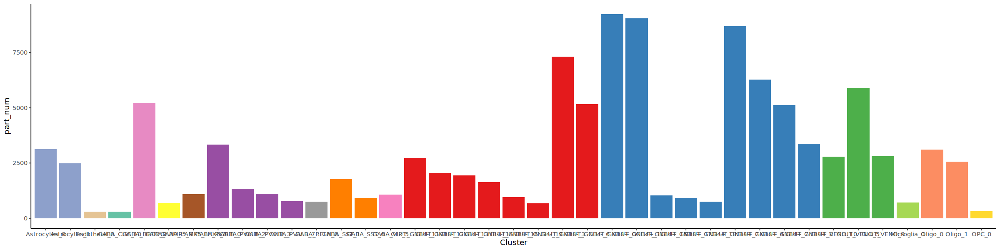

In [22]:
ref=classFiltSeurat3@meta.data
ref=ref[,'Cluster',drop=F]

ref$num=1
sum_ref=ref %>% group_by(Cluster) %>% summarise(part_num=sum(num))
#order=labelTb$label
#sum_ref$Cluster=factor(sum_ref$Cluster,levels=order)

df_col=as.data.frame(pale)
df_col$SuperCluster=rownames(df_col)
df=classFiltSeurat3@meta.data[,c('SuperCluster','Cluster')]
df=df[!duplicated(df),]
df_col=left_join(df,df_col)

repale=df_col$pale
names(repale)=df_col$Cluster

options(repr.plot.width=20, repr.plot.height=5)
gp=ggplot(data = sum_ref, aes(x = Cluster, y = part_num,fill=Cluster)) +
 geom_bar(stat = "identity", position = "stack")+theme_classic()+
scale_fill_manual(values=repale)+NoLegend()
gp

In [23]:
length(unique(classFiltSeurat3$Cluster))

[1] 39

In [24]:
saveRDS(classFiltSeurat3,'/home/liuyx/liuyuxuan/spa_seurat/cla/marmoset/batch_normalize_renew_240115/dif_res_anno/final_anno/39cl_240301_Cluster_Supercluster_res10.rds')



In [1]:
classFiltSeurat3=readRDS('/home/liuyx/liuyuxuan/spa_seurat/cla/marmoset/batch_normalize_renew_240115/dif_res_anno/final_anno/38cl_240119_Cluster_Supercluster_res10.rds')



rgeos version: 0.6-3, (SVN revision 696)
 GEOS runtime version: 3.11.0-CAPI-1.17.0 
 Please note that rgeos will be retired during October 2023,
plan transition to sf or terra functions using GEOS at your earliest convenience.
See https://r-spatial.org/r/2023/05/15/evolution4.html for details.
 GEOS using OverlayNG
 Linking to sp version: 1.6-0 
 Polygon checking: TRUE 




In [2]:
classFiltSeurat3

An object of class Seurat 
63792 features across 109093 samples within 2 assays 
Active assay: SCT (30873 features, 30873 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

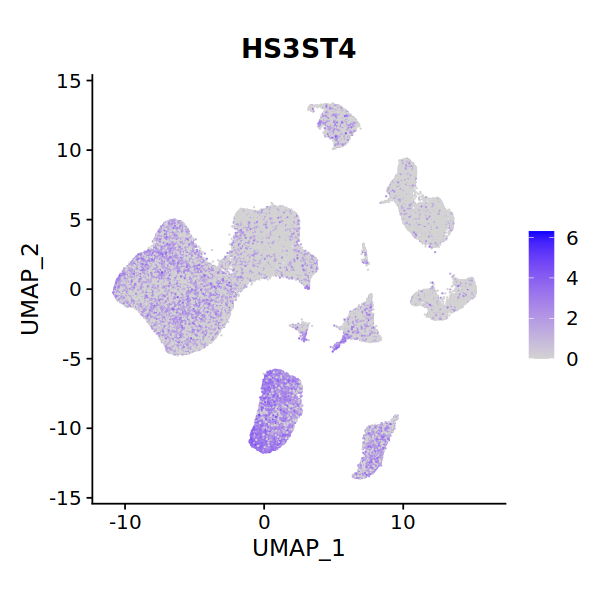

In [11]:

classMarkerTop = c('HS3ST4')

options(repr.plot.width=5, repr.plot.height=5)
gp4=FeaturePlot(classFiltSeurat3, features = classMarkerTop,raster=FALSE)+coord_fixed()

gp4

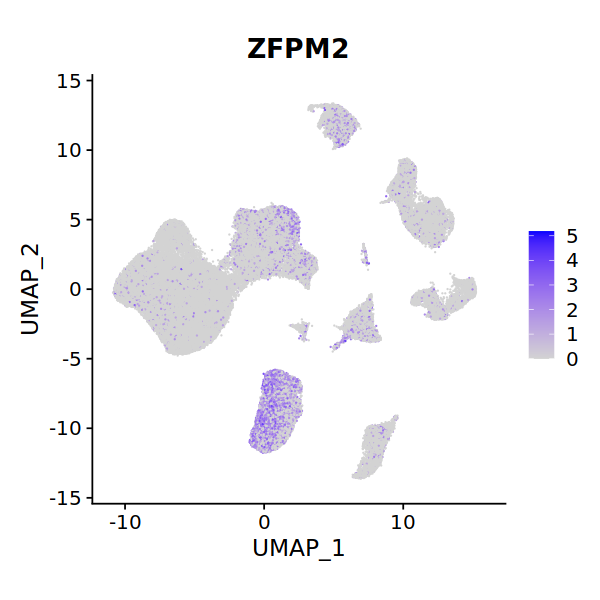

In [14]:

classMarkerTop = c('ZFPM2')

options(repr.plot.width=5, repr.plot.height=5)
gp4=FeaturePlot(classFiltSeurat3, features = classMarkerTop,raster=FALSE)+coord_fixed()

gp4

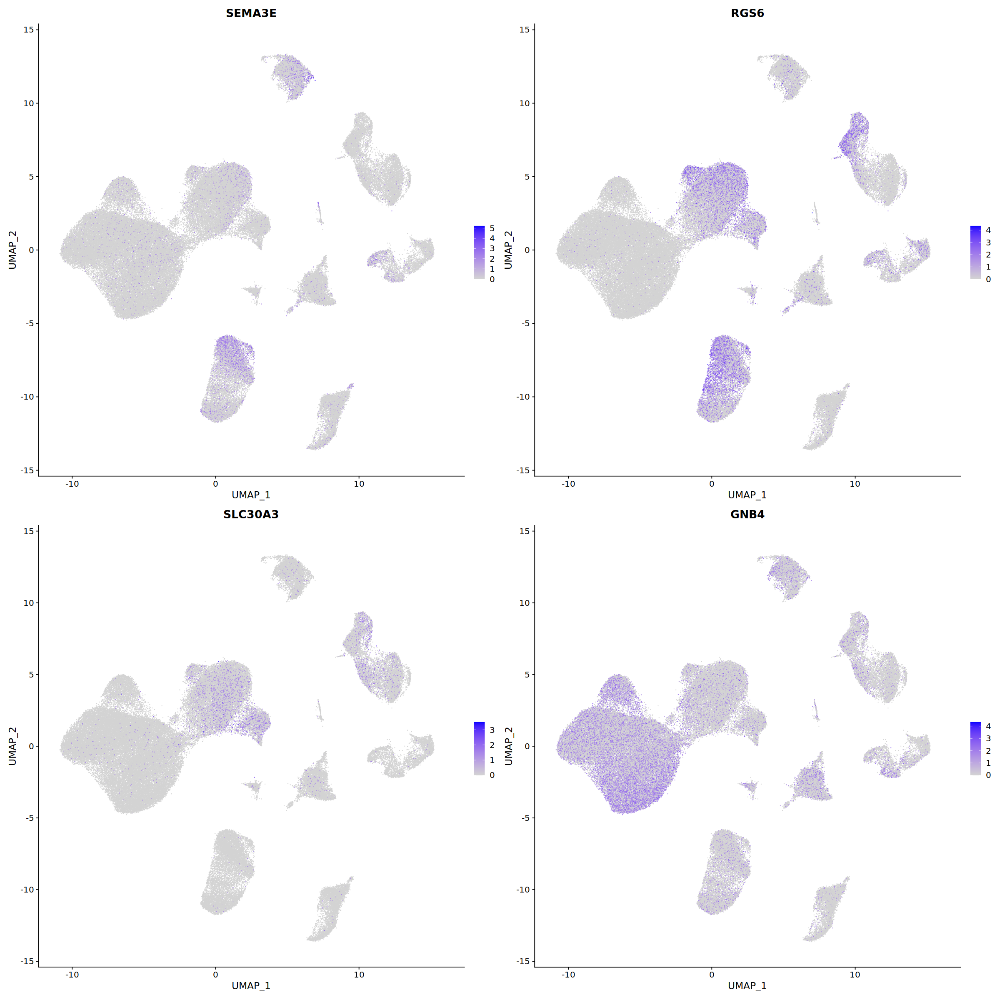

In [3]:

classMarkerTop = c('SEMA3E','RGS6','SLC30A3','GNB4')

options(repr.plot.width=20, repr.plot.height=20)
gp4=FeaturePlot(classFiltSeurat3, features = classMarkerTop,raster=FALSE)+coord_fixed()

gp4

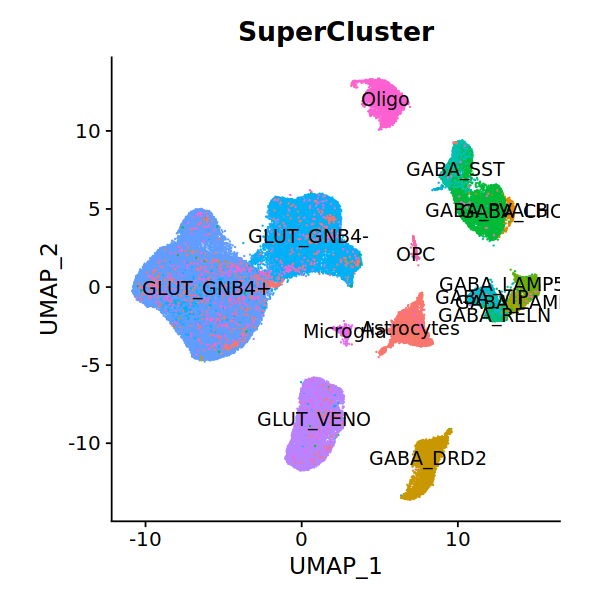

In [7]:
options(repr.plot.width=5, repr.plot.height=5)
DimPlot(classFiltSeurat3,group.by = 'SuperCluster',label=T,raster=FALSE)+coord_fixed()+NoLegend()



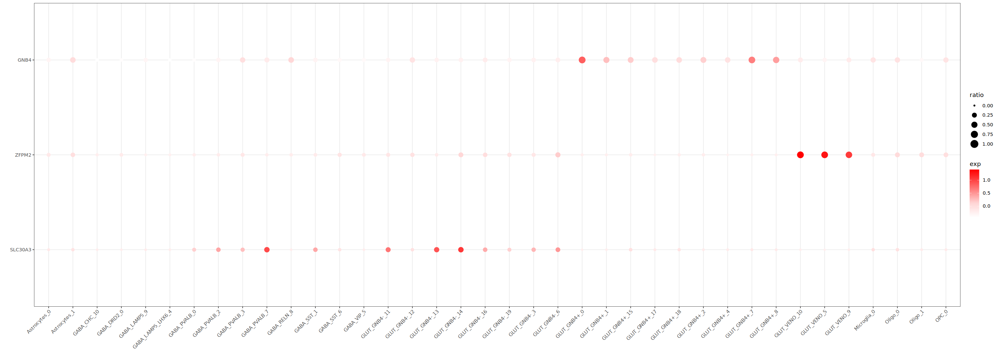

In [13]:
dotplot_genes =c(
                 'GNB4','ZFPM2','SLC30A3'
                 #'UNC5B','SST','POSTN','PDE10A',
                 #'LAMP5','VIP','RELN'
              )
#dotplot_genes=str_to_title(tolower(dotplot_genes))

dotplot_genes=c(dotplot_genes)
mye.seu=classFiltSeurat3
mye.seu$celltype=mye.seu$Cluster
mye.seu@meta.data$CB=rownames(mye.seu@meta.data)
bubble.df=as.matrix(mye.seu[["RNA"]]@data[dotplot_genes,])
bubble.df=t(bubble.df)
bubble.df=as.data.frame(scale(bubble.df))
bubble.df$CB=rownames(bubble.df)
bubble.df=merge(bubble.df,mye.seu@meta.data[,c("CB","celltype")],by = "CB")
bubble.df$CB=NULL

celltype_v=c()
gene_v=c()
mean_v=c()
ratio_v=c()
for (i in unique(bubble.df$celltype)) {
  bubble.df_small=bubble.df%>%filter(celltype==i)
  for (j in dotplot_genes) {
    exp_mean=mean(bubble.df_small[,j])
    exp_ratio=sum(bubble.df_small[,j] > min(bubble.df_small[,j])) / length(bubble.df_small[,j])
    celltype_v=append(celltype_v,i)
    gene_v=append(gene_v,j)
    mean_v=append(mean_v,exp_mean)
    ratio_v=append(ratio_v,exp_ratio)
  }
}

plotdf=data.frame(
  celltype=celltype_v,
  gene=gene_v,
  exp=mean_v,
  ratio=ratio_v
)
plotdf$celltype=factor(plotdf$celltype,levels =  sort(unique(plotdf$celltype)))

plotdf$gene=factor(plotdf$gene,levels = rev(as.character(dotplot_genes)))
plotdf$exp=ifelse(plotdf$exp>3,3,plotdf$exp)

plotdf_fil=plotdf[plotdf$gene %in% dotplot_genes,]

#plotdf_fil$celltype=factor(plotdf_fil$celltype,levels = order)
#plotdf_fil=plotdf_fil[grep('GLUT',plotdf_fil),]
options(repr.plot.width=25, repr.plot.height=9)
gp=ggplot(plotdf_fil,aes(x=celltype,y=gene,size=ratio,color=exp))+geom_point()+
  scale_x_discrete("")+scale_y_discrete("")+
  scale_color_gradientn(colours = c(colorRampPalette(c("white", "#FFD7D7"))(50),colorRampPalette(c("#FFD7D7", "red"))(120)))+
  scale_size_continuous(limits = c(0,1))+theme_bw()+
  theme(
    axis.text.x.bottom = element_text(hjust = 1, vjust = 1, angle = 45)
  )
gp


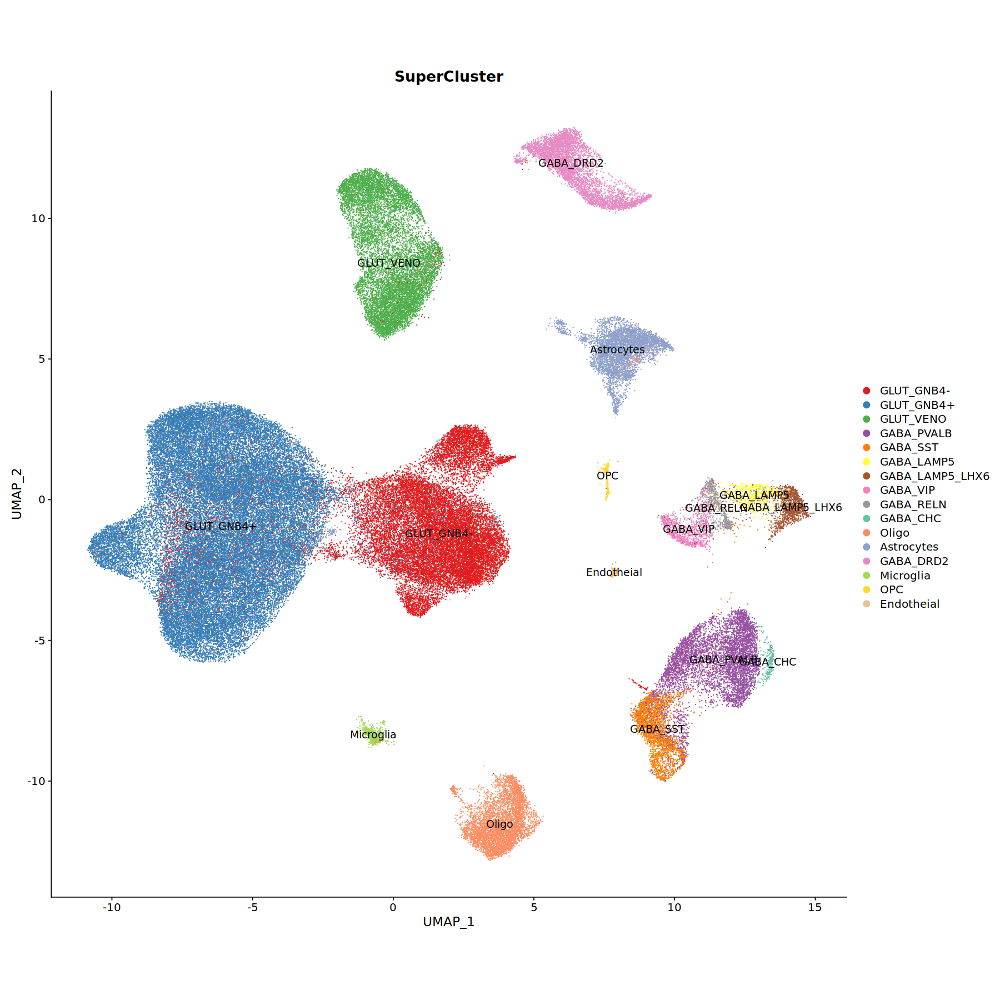

In [25]:
df_col=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_0105/post_analysis/data/color_supercluster.csv')
#need=setdiff(unique(classFiltSeurat3$SuperCluster),df_col$X)
#for(i in c(1:length(need))){
#    df_col=rbind(df_col,c(need[i],brewer.pal(9,"Set3")[i]))
#}
col=df_col$pale
names(col)=df_col$X

options(repr.plot.width=15, repr.plot.height=15)
gp=DimPlot(classFiltSeurat3,group.by = 'SuperCluster',label=T,cols = col,raster=FALSE)+coord_fixed()
gp

In [26]:
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240118/sup_mar_umap.pdf",width=12,height=12)
gp
dev.off()

png 
  2

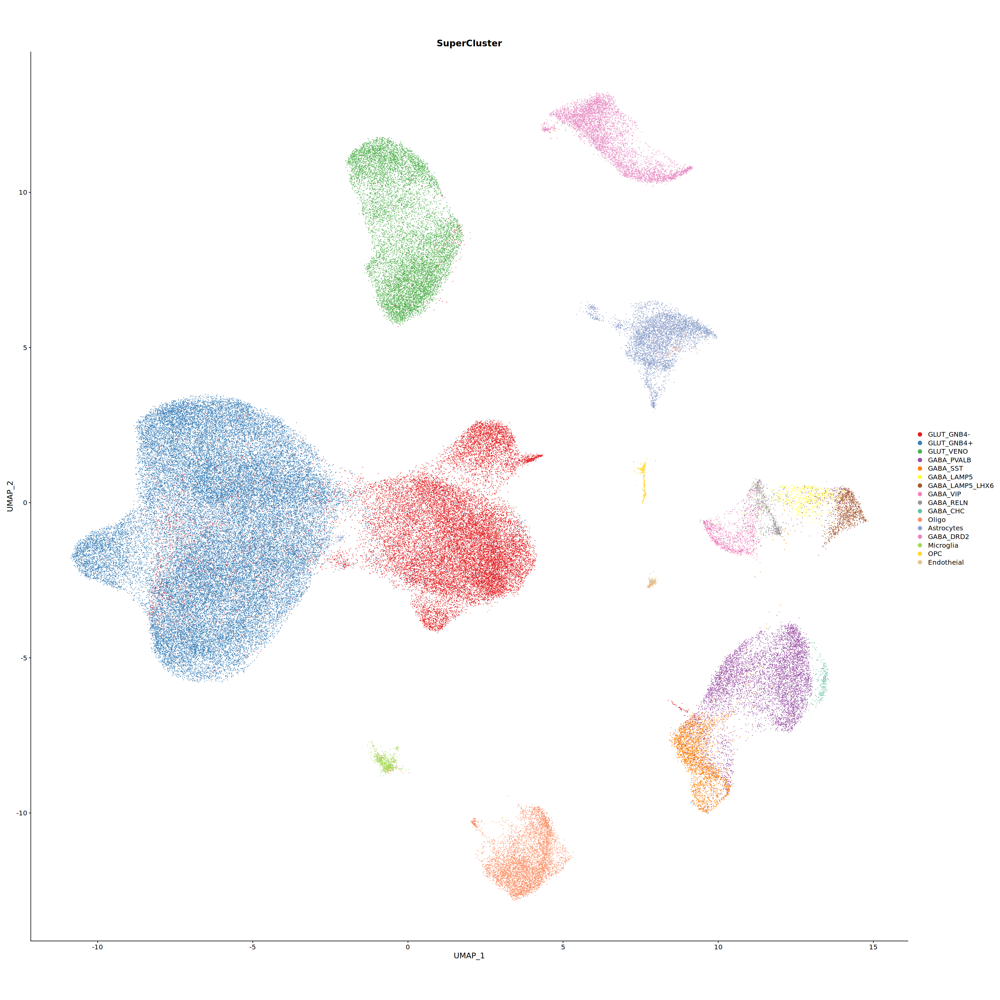

In [31]:
gp=DimPlot(classFiltSeurat3,group.by = 'SuperCluster',label=F,cols = col,raster=FALSE)+coord_fixed()
gp

In [32]:
png("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240118/sup_mar_umap.png",width=900,height=900)
gp
dev.off()


png 
  2

png 
  2

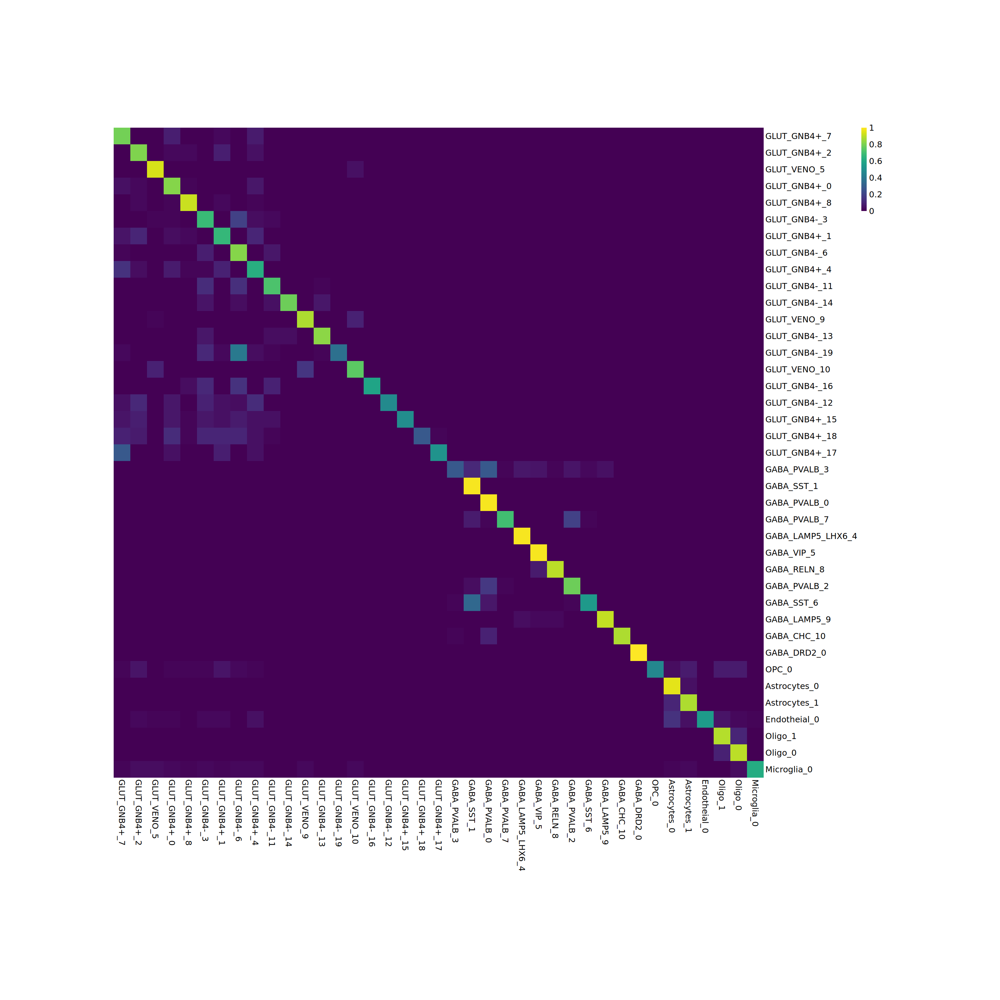

In [27]:
options(repr.plot.width=25, repr.plot.height=25)
df=confusionRatio[unique(classFiltSeurat3$Subclass),unique(classFiltSeurat3$Subclass)]
df_ref=classFiltSeurat3@meta.data[,c('Subclass','Cluster')]
df_ref=df_ref[!duplicated(df_ref),]
rownames(df_ref)=df_ref$Subclass
rownames(df)=df_ref[rownames(df),]$Cluster
colnames(df)=df_ref[colnames(df),]$Cluster



png 
  2

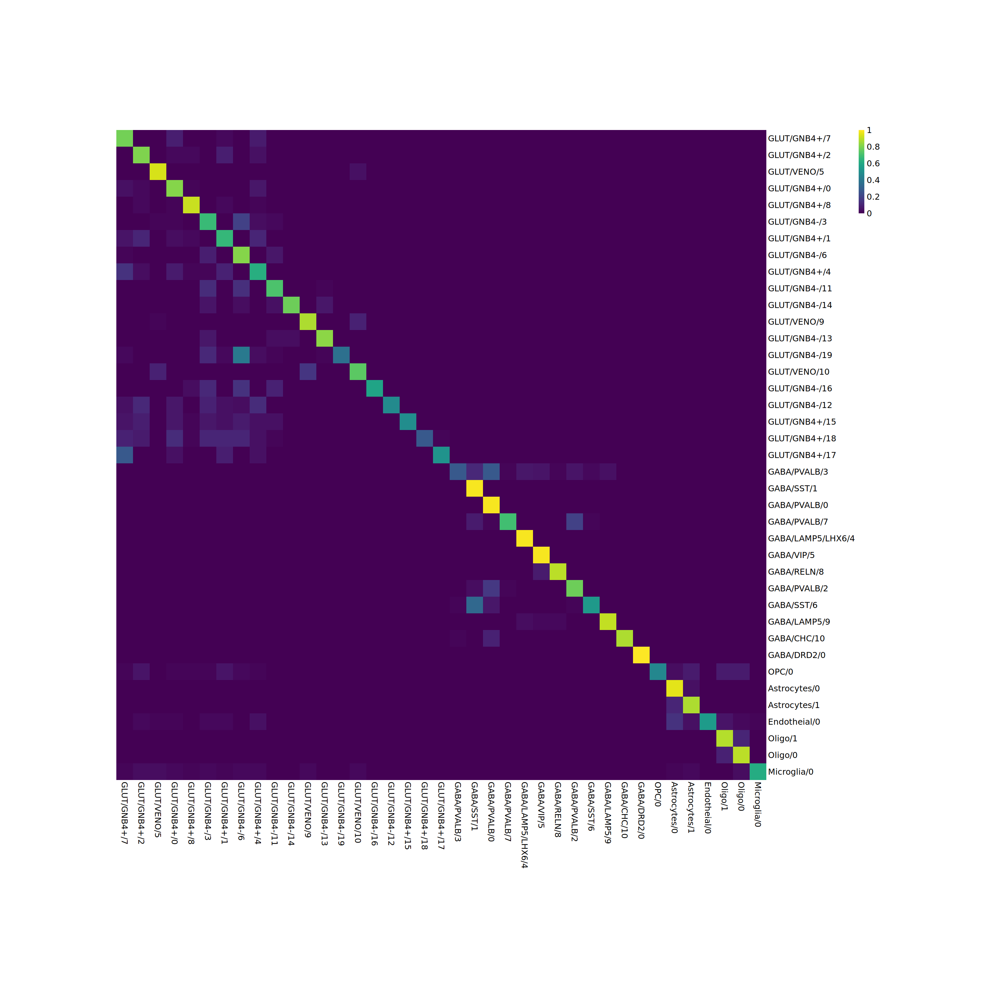

In [30]:
rownames(df)=gsub('_','/',rownames(df))
colnames(df)=gsub('_','/',colnames(df))

gp=pheatmap(df
, breaks=seq(0,1,0.01), cluster_rows=F, cluster_cols=F, border_color=NA, cellwidth=30, cellheight=30, fontsize=15,color = viridis(100))

save_pheatmap_pdf <- function(x, filename, width=15, height=15) {
  stopifnot(!missing(x))
  stopifnot(!missing(filename))
  pdf(filename, width=width, height=height)
  grid::grid.newpage()
  grid::grid.draw(x$gtable)
  dev.off()
}

save_pheatmap_pdf(gp,"/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240118/sup_mar_RF.pdf",40,40)

